In [601]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import lightgbm as lgb
import json
import ast
import eli5
import plotly.graph_objects as go
import plotly.offline as py
from wordcloud import WordCloud
from collections import Counter
from bayes_opt import BayesianOptimization
from scipy import stats
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, roc_auc_score, r2_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression

In [602]:
train = pd.read_csv("./train.csv")
test = pd.read_csv("./test.csv")

In [603]:
# Dataset has a few features that contain dictionaries (objects)

dict_cols = []

def safe_eval(df, x):
    rt = None
    
    try:
        rt = ast.literal_eval(df[x][1])
    except Exception as e:
        rt = "Not_A_Dictionary"

    return rt

print(train.select_dtypes(include=['object_']).columns)
train_cats = train[train.select_dtypes(include=['object_']).columns]

dict_cols = [x for x in train_cats.columns if isinstance(
    safe_eval(train, x), list)]


def test_to_dict(df):
    for column in dict_cols:
        df[column] = df[column].apply(lambda x: {} if pd.isna(x) else ast.literal_eval(x))
    
    return df

train = test_to_dict(train)
test = test_to_dict(test)

Index(['belongs_to_collection', 'genres', 'homepage', 'imdb_id',
       'original_language', 'original_title', 'overview', 'poster_path',
       'production_companies', 'production_countries', 'release_date',
       'spoken_languages', 'status', 'tagline', 'title', 'Keywords', 'cast',
       'crew'],
      dtype='object')


In [604]:
train.head(10)

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,release_date,runtime,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue
0,1,"[{'id': 313576, 'name': 'Hot Tub Time Machine ...",14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,2/20/15,93.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651
1,2,"[{'id': 107674, 'name': 'The Princess Diaries ...",40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,8/6/04,113.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435
2,3,{},3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,10/10/14,105.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000
3,4,{},1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,3/9/12,122.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000
4,5,{},0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,2/5/09,118.0,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,{},"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970
5,6,{},8000000,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",NaN,tt0093743,en,Pinocchio and the Emperor of the Night,"Pinocchio and his friends, a glow worm and a m...",0.743274,...,8/6/87,83.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Pinocchio and the Emperor of the Night,{},"[{'cast_id': 6, 'character': 'Pinocchio (voice...","[{'credit_id': '52fe46f49251416c9106558b', 'de...",3261638
6,7,{},14000000,"[{'id': 27, 'name': 'Horror'}, {'id': 53, 'nam...",http://www.thepossessionmovie.com/,tt0431021,en,The Possession,A young girl buys an antique box at a yard sal...,7.286477,...,8/30/12,92.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Fear The Demon That Doesn't Fear God,The Possession,{},"[{'cast_id': 23, 'character': 'Clyde', 'credit...","[{'credit_id': '52fe4981c3a368484e12ee29', 'de...",85446075
7,8,{},0,"[{'id': 99, 'name': 'Documentary'}]",NaN,tt0391024,en,Control Room,A chronicle which provides a rare window into ...,1.949044,...,1/15/04,84.0,"[{'iso_639_1': 'ar', 'name': 'العربية'}, {'iso...",Released,Different channels. Different truths.,Control Room,"[{'id': 917, 'name': 'journalism'}, {'id': 163...","[{'cast_id': 2, 'character': 'Himself', 'credi...","[{'credit_id': '52fe47a69251416c750a0daf', 'de...",2586511
8,9,"[{'id': 256377, 'name': 'The Muppet Collection...",0,"[{'id': 28, 'name': 'Action'}, {'id': 35, 'nam...",NaN,tt0117110,en,Muppet Treasure Island,After telling the story of Flint's last journe...,6.902423,...,2/16/96,100.0,"[{'iso_639_1

In [605]:
# Do some feature engineering for a 'belongs_to_collection' column

def modify_btc(df):
 df['collection_name'] = df['belongs_to_collection'].apply(lambda x: x[0]['name'] if x != {} else 0)
 df["has_collection"] = df['belongs_to_collection'].apply(lambda x: len(x) if x != {} else 0)

 df = df.drop(['belongs_to_collection'], axis=1)

 return df

train = modify_btc(train)
test = modify_btc(test)

In [606]:
list_of_genres = list(train['genres'].apply(lambda x: [i['name'] for i in x] if x != {} else []).values)

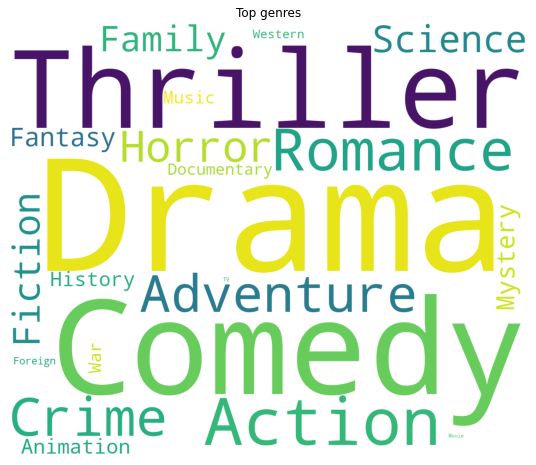

In [607]:
plt.figure(figsize=(12,8))
text = " ".join([i for j in list_of_genres for i in j])
wordcloud = WordCloud(background_color='white', collocations=False, width=1200, height=1000).generate(text)

plt.imshow(wordcloud)
plt.title("Top genres")
plt.axis('off')
plt.show()

In [608]:
# Let's do the same with the genres

def modify_gnr(df):
 df['num_genres'] = df['genres'].apply(lambda x: len(x) if x != {} else 0)
 df['all_genres'] = df['genres'].apply(lambda x: " ".join(sorted([i['name'] for i in x])) if x != {} else "")

 top_genres = [m[0] for m in Counter([i for j in list_of_genres for i in j]).most_common(15)]

 for g in top_genres:
  df[f"genre_{g}"] = df['all_genres'].apply(lambda x: 1 if g in x else 0)

 df = df.drop(['genres'], axis = 1)

 return df

train = modify_gnr(train)
test = modify_gnr(test)

In [609]:
train.head(10)

,id,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,...,genre_Crime,genre_Adventure,genre_Horror,genre_Science Fiction,genre_Family,genre_Fantasy,genre_Mystery,genre_Animation,genre_History,genre_Music
0,1,14000000,NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,/tQtWuwvMf0hCc2QR2tkolwl7c3c.jpg,"[{'name': 'Paramount Pictures', 'id': 4}, {'na...",...,0,0,0,0,0,0,0,0,0,0
1,2,40000000,NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,/w9Z7A0GHEhIp7etpj0vyKOeU1Wx.jpg,"[{'name': 'Walt Disney Pictures', 'id': 2}]",...,0,0,0,0,1,0,0,0,0,0
2,3,3300000,http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,/lIv1QinFqz4dlp5U4lQ6HaiskOZ.jpg,"[{'name': 'Bold Films', 'id': 2266}, {'name': ...",...,0,0,0,0,0,0,0,0,0,0
3,4,1200000,http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,/aTXRaPrWSinhcmCrcfJK17urp3F.jpg,{},...,0,0,0,0,0,0,0,0,0,0
4,5,0,NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,/m22s7zvkVFDU9ir56PiiqIEWFdT.jpg,{},...,0,0,0,0,0,0,0,0,0,0
5,6,8000000,NaN,tt0093743,en,Pinocchio and the Emperor of the Night,"Pinocchio and his friends, a glow worm and a m...",0.743274,/6IDqA1D2NBIVhzEEaMMRL28iBrq.jpg,{},...,0,1,0,0,1,0,0,1,0,0
6,7,14000000,http://www.thepossessionmovie.com/,tt0431021,en,The Possession,A young girl buys an antique box at a yard sal...,7.286477,/4QjzFuaZmB4btGnLwAgdp23BzIU.jpg,"[{'name': 'Ghost House Pictures', 'id': 768}, ...",...,0,0,1,0,0,0,0,0,0,0
7,8,0,NaN,tt0391024,en,Control Room,A chronicle which provides a rare window into ...,1.949044,/83BV8fGy5p9i8RwE9oj76tZ1Ikp.jpg,{},...,0,0,0,0,0,0,0,0,0,0
8,9,0,NaN,tt0117110,en,Muppet Treasure Island,After telling the story of Flint's last journe...,6.902423,/5A8gKzOrF9Z7tSUX6xd5dEx4NXf.jpg,"[{'name': 'Walt Disney Pictures', 'id': 2}, {'...",...,0,1,0,0,1,0,0,0,0,1
9,10,6000000,NaN,tt0310281,en,A Mighty Wind,"In ""A Mighty Wind"", director Christopher Guest...",4.672036,/xwD4EsPOGLuKP50Q1gwqAsyhAFB.jpg,"[{'name': 'Castle Rock Entertainment', 'id': 97}]",...,0,0,0,0,0,0,0,0,0,1


In [610]:
# Moving to the "production_companies" column

list_of_companies = list(train["production_companies"].apply(lambda x: [i['name'] for i in x] if x != {} else []).values)

In [611]:
Counter([i for j in list_of_companies for i in j]).most_common(30)

[('Warner Bros.', 202),
 ('Universal Pictures', 188),
 ('Paramount Pictures', 161),
 ('Twentieth Century Fox Film Corporation', 138),
 ('Columbia Pictures', 91),
 ('Metro-Goldwyn-Mayer (MGM)', 84),
 ('New Line Cinema', 75),
 ('Touchstone Pictures', 63),
 ('Walt Disney Pictures', 62),
 ('Columbia Pictures Corporation', 61),
 ('TriStar Pictures', 53),
 ('Relativity Media', 48),
 ('Canal+', 46),
 ('United Artists', 44),
 ('Miramax Films', 40),
 ('Village Roadshow Pictures', 36),
 ('Regency Enterprises', 31),
 ('BBC Films', 30),
 ('Dune Entertainment', 30),
 ('Working Title Films', 30),
 ('Fox Searchlight Pictures', 29),
 ('StudioCanal', 28),
 ('Lionsgate', 28),
 ('DreamWorks SKG', 27),
 ('Fox 2000 Pictures', 25),
 ('Summit Entertainment', 24),
 ('Hollywood Pictures', 24),
 ('Orion Pictures', 24),
 ('Amblin Entertainment', 23),
 ('Dimension Films', 23)]

In [612]:
def modify_cmp(df):
 df['num_companies'] = df['production_companies'].apply(lambda x: len(x) if x != {} else 0)

 df["all_production_companies"] = df['production_companies'].apply(lambda x: " ".join(sorted([i['name'] for i in x])) if x != {} else "")

 top_companies = [m[0] for m in Counter([i for j in list_of_companies for i in j]).most_common(30)]

 for company in top_companies:
  df[f"production_company_{company}"] = df['all_production_companies'].apply(lambda x: 1 if company in x else 0)

 df = df.drop(['production_companies'], axis = 1)

 return df

train = modify_cmp(train)
test = modify_cmp(test)

In [613]:
# We also have a "production_countries" column which can be modified in the same manner as the previous one.

list_of_countries = list(train['production_countries'].apply(lambda x: [i['name'] for i in x] if x != {} else []).values)
Counter([i for j in list_of_countries for i in j]).most_common(25)

[('United States of America', 2282),
 ('United Kingdom', 380),
 ('France', 222),
 ('Germany', 167),
 ('Canada', 120),
 ('India', 81),
 ('Italy', 64),
 ('Japan', 61),
 ('Australia', 61),
 ('Russia', 58),
 ('Spain', 54),
 ('China', 42),
 ('Hong Kong', 42),
 ('Ireland', 23),
 ('Belgium', 23),
 ('South Korea', 22),
 ('Mexico', 19),
 ('Sweden', 18),
 ('New Zealand', 17),
 ('Netherlands', 15),
 ('Czech Republic', 14),
 ('Denmark', 13),
 ('Brazil', 12),
 ('Luxembourg', 10),
 ('South Africa', 10)]

In [614]:
def modify_cntr(df):
 df['num_countries'] = df['production_countries'].apply(lambda x: len(x) if x != {} else 0)
 df['all_countries'] = df['production_countries'].apply(
     lambda x: " ".join(sorted([i['name'] for i in x])) if x != {} else "" )
 
 top_countries = [m[0] for m in Counter([i for j in list_of_countries for i in j]).most_common(25)]

 for c in top_countries:
    df[f'production_country_{c}'] = df['all_countries'].apply(lambda x: 1 if c in x else 0)

 df = df.drop(['production_countries'], axis = 1)

 return df

train = modify_cntr(train)
test = modify_cntr(test)

In [615]:
# Once again, but this time for the languages

list_of_languages = list(train['spoken_languages'].apply(
    lambda x: [i['name'] for i in x]).values)

top_languages = [m[0] for m in Counter(
    [i for j in list_of_languages for i in j]).most_common(30)]
top_languages

['English',
 'Français',
 'Español',
 'Deutsch',
 'Pусский',
 'Italiano',
 '日本語',
 '普通话',
 'हिन्दी',
 '',
 'Português',
 'العربية',
 '한국어/조선말',
 '广州话 / 廣州話',
 'தமிழ்',
 'Polski',
 'Magyar',
 'Latin',
 'svenska',
 'ภาษาไทย',
 'Český',
 'עִבְרִית',
 'ελληνικά',
 'Türkçe',
 'Dansk',
 'Nederlands',
 'فارسی',
 'Tiếng Việt',
 'اردو',
 'Română']

In [616]:
def modify_lng(df):
 df['num_languages'] = df['spoken_languages'].apply(lambda x: len(x) if x != {} else 0)
 df['all_languages'] = df['spoken_languages'].apply(
     lambda x: " ".join(sorted([i['name'] for i in x])) if x != {} else "")
     
 
 for l in top_languages:
    df[f"language_{l}"] = df['all_languages'].apply(lambda x: 1 if l in x else 0)
 
 df = df.drop(['spoken_languages'], axis = 1)

 return df

train = modify_lng(train)
test = modify_lng(test)

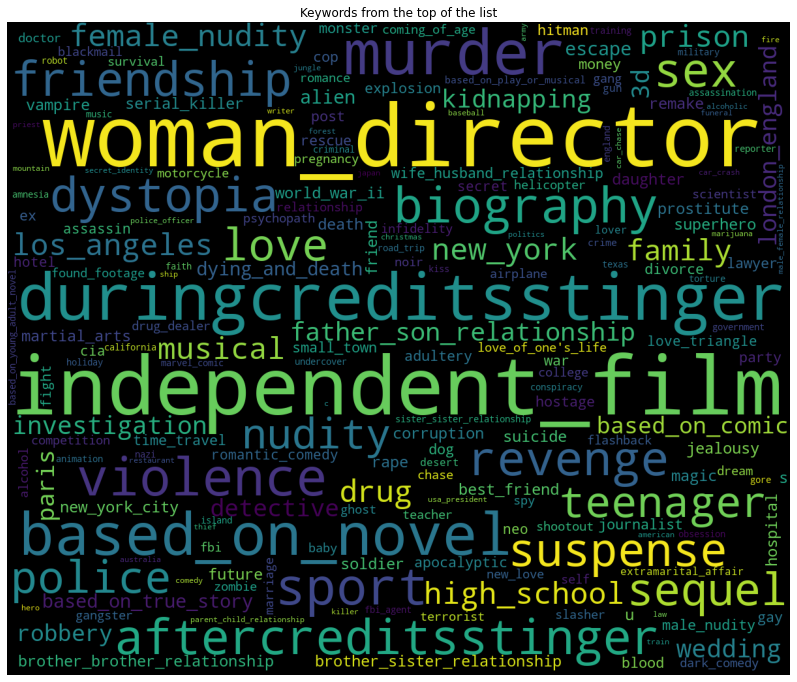

In [617]:
# WordCloud for the "Keywords" column

list_of_keywords = list(train['Keywords'].apply(lambda x: [i['name'] for i in x] if x != {} else []).values)

plt.figure(figsize = (16,12))
text = ' '.join(["_".join(i.split(' ')) for j in list_of_keywords for i in j])

wordcloud = WordCloud(background_color='black', collocations=False, width=1200, height=1000).generate(text)
plt.imshow(wordcloud)
plt.title("Keywords from the top of the list")
plt.axis("off")
plt.show()

In [618]:
# "Keywords" column processing

def modify_kwds(df):
 df['num_keywords'] = df['Keywords'].apply(lambda x: len(x) if x != {} else 0)
 df['all_keywords'] = df['Keywords'].apply(
     lambda x: " ".join(sorted([i['name'] for i in x])) if x != {} else "")
 
 top_keywords = [m[0] for m in Counter([i for j in list_of_keywords for i in j]).most_common(30)]

 for k in top_keywords:
    df[f'keyword_{k}'] = df['all_keywords'].apply(lambda x: 1 if k in x else 0)

 df = df.drop(["Keywords"], axis = 1)

 return df

train = modify_kwds(train)
test = modify_kwds(test)


In [619]:
# Now it is the time to do similar manipulations with the "cast" column

list_of_cast_names = list(train['cast'].apply(
    lambda x: [i['name'] for i in x] if x != {} else []).values)
top_cast_names = Counter([i for j in list_of_cast_names for i in j]).most_common(30)
list_of_cast_names

[['Rob Corddry',
  'Craig Robinson',
  'Clark Duke',
  'Adam Scott',
  'Chevy Chase',
  'Gillian Jacobs',
  'Bianca Haase',
  'Collette Wolfe',
  'Kumail Nanjiani',
  'Kellee Stewart',
  'Josh Heald',
  'Gretchen Koerner',
  'Lisa Loeb',
  'Jessica Williams',
  'Bruce Buffer',
  'Mariana Paola Vicente',
  'Christian Slater',
  'Jason Jones',
  'Olivia Jordan',
  'Christine Bently',
  'Stacey Asaro',
  'John Cusack',
  'Adam Herschman',
  'Kisha Sierra'],
 ['Anne Hathaway',
  'Julie Andrews',
  'H√©ctor Elizondo',
  'John Rhys-Davies',
  'Heather Matarazzo',
  'Chris Pine',
  'Callum Blue',
  'Larry Miller',
  'Raven-Symon√©',
  'Kathleen Marshall',
  'Caroline Goodall',
  'Lorraine Nicholson',
  'Shannon Wilcox',
  'Greg Lewis',
  'Abigail Breslin',
  'Paul Vogt',
  'Joseph Leo Bwarie',
  'Hope Alexander-Willis',
  'Rowan Joseph',
  'Jeffrey Scott Jensen'],
 ['Miles Teller',
  'J.K. Simmons',
  'Melissa Benoist',
  'Austin Stowell',
  'Jayson Blair',
  'Kavita Patil',
  'Paul Reiser',


In [620]:
list_of_cast_genders = list(train['cast'].apply(lambda x: [i['gender'] for i in x] if x != {} else []).values)
genders = Counter([i for j in list_of_cast_genders for i in j]).most_common()

In [621]:
list_of_cast_characters = list(train['cast'].apply(
    lambda x: [i['character'] for i in x] if x != {} else []).values)
common_characters = Counter([i for j in list_of_cast_characters for i in j]).most_common(20)

In [622]:
def modify_cast(df):
 df['num_cast'] = df['cast'].apply(lambda x: len(x) if x != {} else 0)
 top_cast_actors = [m[0] for m in top_cast_names]
 
 for a in top_cast_actors:
  df[f'actor_{a}'] = df['cast'].apply(lambda x: 1 if a in str(x) else 0)
 
 df["gender_0_cast"] = df['cast'].apply(
     lambda x: sum([1 for i in x if i['gender'] == 0]))
 df["gender_1_cast"] = df['cast'].apply(
     lambda x: sum([1 for i in x if i['gender'] == 1]))
 df['gender_2_cast'] = df['cast'].apply(lambda x: sum([1 for i in x if i['gender'] == 2]))

 top_cast_characters = [m[0] for m in common_characters]

 for c in top_cast_characters:
  df[f'character_'] = df['cast'].apply(lambda x: 1 if c in str(x) else 0)
 
 df = df.drop(['cast'], axis = 1)

 return df

train = modify_cast(train)
test = modify_cast(test)

In [623]:
# Now it is time to sort out the "crew" column

list_of_crew_names = list(train['crew'].apply(
    lambda x: [i['name'] for i in x] if x != {} else []).values)
common_crew_names = Counter([i for j in list_of_crew_names for i in j]).most_common(30)

list_of_crew_jobs = list(train['crew'].apply(lambda x: [i['job'] for i in x] if x != {} else []).values)
common_crew_jobs = Counter([i for j in list_of_crew_jobs for i in j]).most_common(30)

list_of_crew_genders = list(train['crew'].apply(lambda x: [i['gender'] for i in x] if x != {} else []).values)
common_crew_genders = Counter([i for j in list_of_crew_genders for i in j]).most_common()

list_of_crew_departments = list(train['crew'].apply(lambda x: [i['department'] for i in x] if x != {} else []).values)
common_crew_departments = Counter([i for j in list_of_crew_departments for i in j]).most_common()
common_crew_departments


[('Production', 15887),
 ('Sound', 9319),
 ('Art', 8069),
 ('Crew', 7315),
 ('Writing', 6567),
 ('Costume & Make-Up', 6156),
 ('Camera', 5424),
 ('Directing', 4954),
 ('Editing', 4508),
 ('Visual Effects', 3591),
 ('Lighting', 1303),
 ('Actors', 4)]

In [624]:
common_crew_names = [m[0] for m in common_crew_names]
common_crew_jobs = [m[0] for m in common_crew_jobs]
common_crew_departments = [m[0] for m in common_crew_departments]

def modify_crew(df):
 df['num_crew'] = df['crew'].apply(lambda x: len(x) if x != {} else 0)

 for n in common_crew_names:
  df[f'crew_name_{n}'] = df['crew'].apply(lambda x: 1 if n in str(x) else 0)
 
 df['gender_0_crew'] = df['crew'].apply(lambda x: sum([1 for i in x if i['gender'] == 0]))
 df['gender_1_crew'] = df['crew'].apply(lambda x: sum([1 for i in x if i['gender'] == 1]))
 df['gender_2_crew'] = df['crew'].apply(lambda x: sum([1 for i in x if i['gender'] == 2]))

 for j in common_crew_jobs:
  df[f'crew_job_{j}'] = df['crew'].apply(lambda x: sum([1 for i in x if i['job'] == j]))
 
 for d in common_crew_departments:
  df[f'crew_department_{d}'] = df['crew'].apply(lambda x: 1 if d in str(x) else 0)
 
 df = df.drop(['crew'], axis = 1)

 return df

train = modify_crew(train)
test = modify_crew(test)

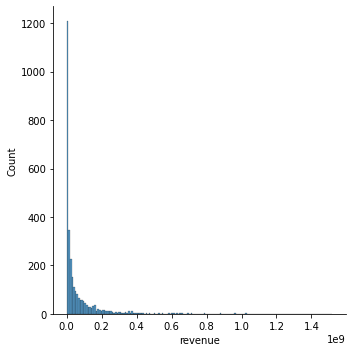

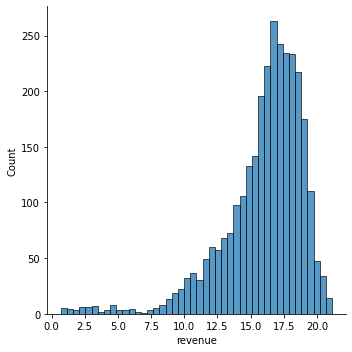

In [625]:
sns.displot(train['revenue'])
sns.displot(np.log1p(train['revenue']))

In [626]:
train['log_revenue'] = np.log1p(train['revenue'])

Text(0.5, 1.0, 'Distribution of the log1p of budget')

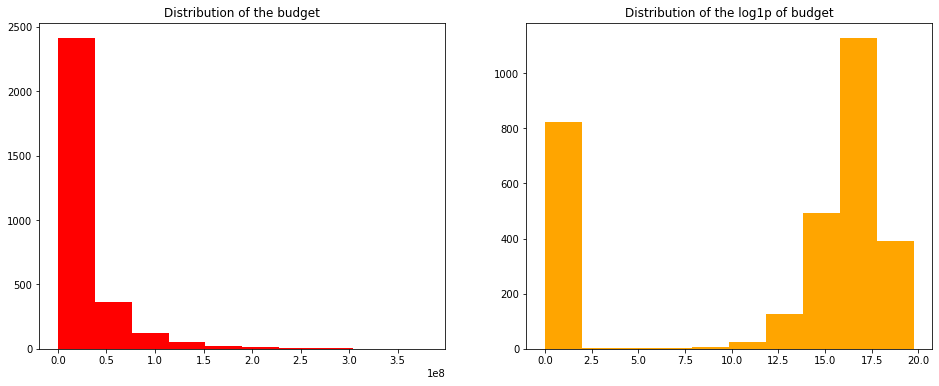

In [627]:
fig,ax = plt.subplots(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.hist(train['budget'], color='red')
plt.title("Distribution of the budget")

plt.subplot(1, 2, 2)
plt.hist(np.log1p(train['budget']), color='orange')
plt.title("Distribution of the log1p of budget")


In [628]:
train['log_budget'] = np.log1p(train['budget'])
test['log_budget'] = np.log1p(test['budget'])

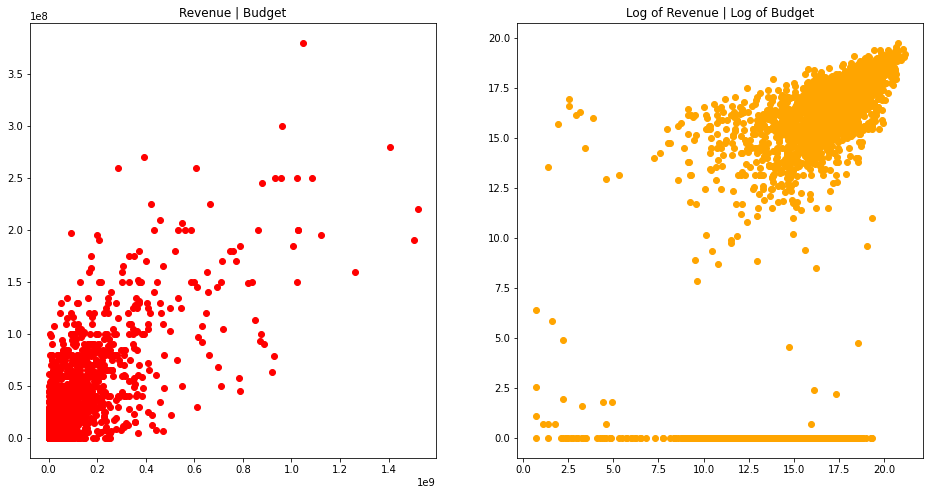

In [629]:
plt.subplots(figsize=(16,8))
plt.subplot(1, 2, 1)
plt.title("Revenue | Budget")
plt.scatter(train['revenue'], train['budget'], color='red')

plt.subplot(1, 2, 2)
plt.title("Log of Revenue | Log of Budget")
plt.scatter(train['log_revenue'], train['log_budget'], color='orange')

In [630]:
train['has_homepage'] = 0
test['has_homepage'] = 0

train.loc[train['homepage'].isnull() == False, 'has_homepage'] = 1
test.loc[test['homepage'].isnull() == False, 'has_homepage'] = 1

Text(0.5, 1.0, 'Correlation between homepage and revenue')

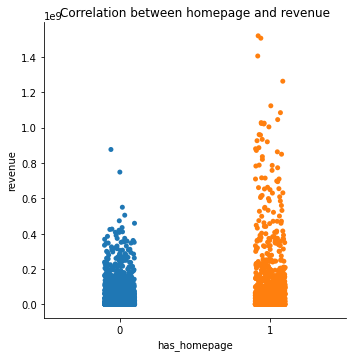

In [631]:
sns.catplot(x = "has_homepage", y = 'revenue', data = train)
plt.title("Correlation between homepage and revenue")

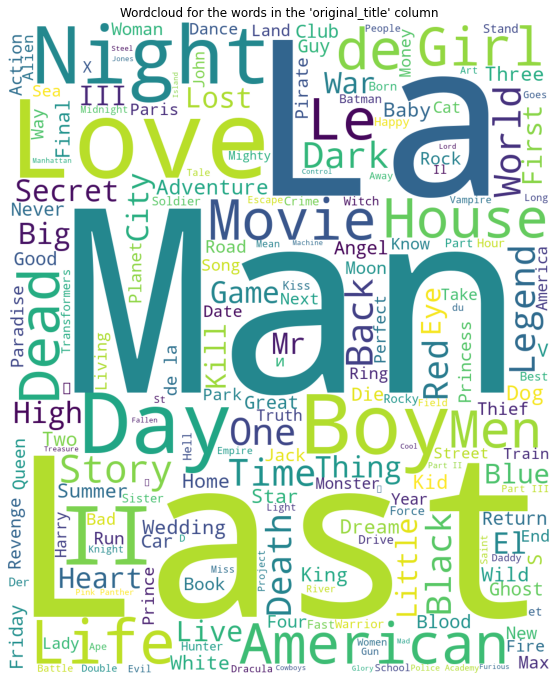

In [632]:
text = ' '.join(train['original_title'].values)
wc = WordCloud(background_color='white', width=1000, height=1200).generate(text)

plt.figure(figsize=(12,12))
plt.imshow(wc)
plt.axis("off")
plt.title("Wordcloud for the words in the 'original_title' column")
plt.show()

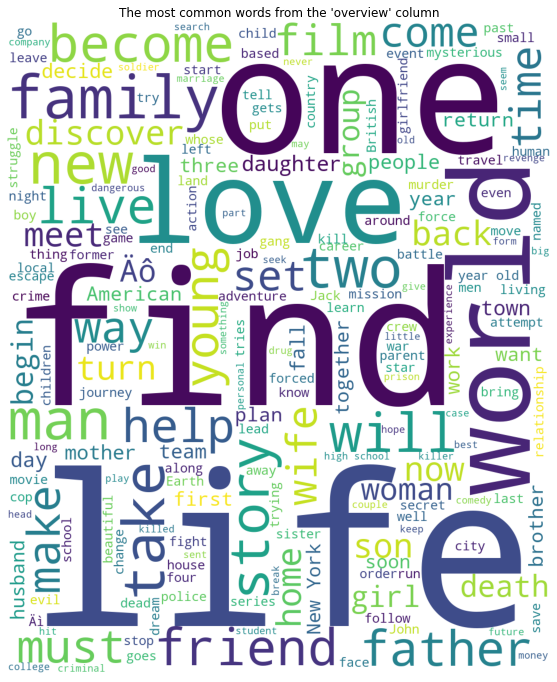

In [633]:
# Wordcloud for the 'overview' column

text = ' '.join(train['overview'].fillna('').values)
wc = WordCloud(background_color='white', height=1200, width=1000).generate(text)

plt.figure(figsize=(12,12))
plt.imshow(wc)
plt.axis('off')
plt.title("The most common words from the 'overview' column")
plt.show()

In [634]:
# That's a cool one, now we will analyze the text of the overviews we have

vectorizer = TfidfVectorizer(
 sublinear_tf = True,
 analyzer = 'word',
 token_pattern = r'\w{1,}',
 ngram_range = (1,2),
 min_df = 5
)

overview_text = vectorizer.fit_transform(train['overview'].fillna(''))
linreg = LinearRegression()
linreg.fit(overview_text, train['log_revenue'])
eli5.show_weights(linreg, vec = vectorizer, top = 20, feature_filter = lambda x: x != '<BIAS>')

c:\Users\Administrator\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [635]:
print("Target value:", train['log_revenue'][1000])
eli5.show_prediction(linreg, doc=train['overview'].values[1000], vec=vectorizer)

Target value: 16.44583954907521


In [636]:
# Fill the gaps in the 'release_date' feature and adjust it according to the 'datetime' format

test.loc[test['release_date'].isnull() == True, 'release_date'] = "01/01/98"

train['release_date'] = pd.to_datetime(train['release_date'])
test['release_date'] = pd.to_datetime(test['release_date'])

In [637]:
# Expand the "release_date" feature

def process_date(df):
 params = ["year", "month", "weekday", "day", "quarter"]

 for p in params:
  df[f"release_date_{p}"] = getattr(df['release_date'].dt, p).astype(int)
 
 return df

train = process_date(train)
test = process_date(test)

In [638]:
d1 = train['release_date_year'].value_counts().sort_index()
d2 = test['release_date_year'].value_counts().sort_index()

data = [go.Scatter(x = d1.index, y = d1.values, name = 'train'), go.Scatter(x = d2.index, y = d2.values, name = 'test')]
layout = go.Layout(dict(title="Number of films per year", xaxis = dict(title = "Year"), yaxis = dict(title="Count") ),
 legend = dict(orientation='v'))
py.iplot(dict(data = data, layout = layout))

In [639]:
d1 = train['release_date_year'].value_counts().sort_index()
d2 = train.groupby(['release_date_year'])['revenue'].mean()

data = [go.Scatter(name = "film count", x = d1.index, y = d1.values), go.Scatter(name = "revenue", x = d2.index, y = d2.values, yaxis = "y2")]

layout = go.Layout(dict(title="Am-nt of films and total revenue per year", xaxis=dict(title="Year"), yaxis=dict(title="Count"),
                   yaxis2=dict(title="Total revenue", overlaying='y', side='right')), legend=dict(orientation='v'))
py.iplot(dict(data = data, layout = layout))

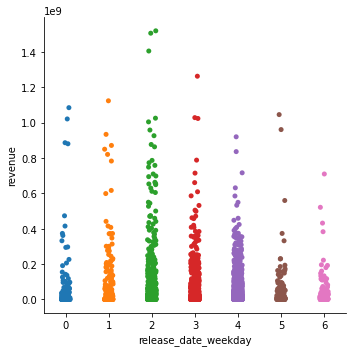

In [640]:
sns.catplot(x="release_date_weekday", y="revenue", data = train)

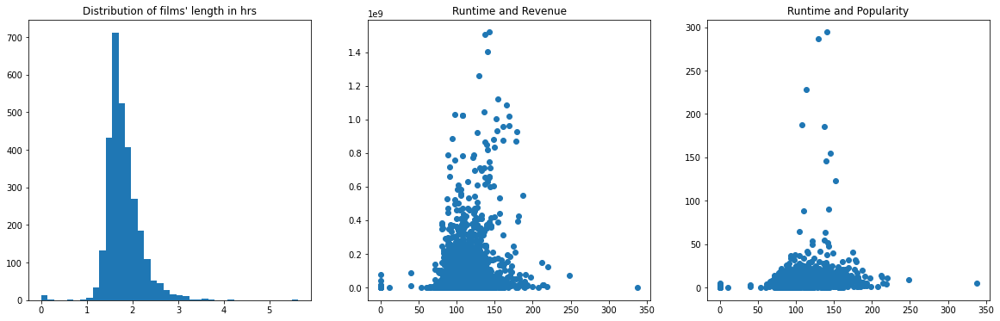

In [641]:
plt.figure(figsize=(20,6))
plt.subplot(1, 3, 1)
plt.title("Distribution of films' length in hrs")
plt.hist(train['runtime'].fillna(0) / 60, bins = 40)

plt.subplot(1, 3, 2)
plt.title("Runtime and Revenue")
plt.scatter(train['runtime'].fillna(0), train['revenue'])

plt.subplot(1, 3, 3)
plt.title("Runtime and Popularity")
plt.scatter(train['runtime'].fillna(0), train['popularity'])

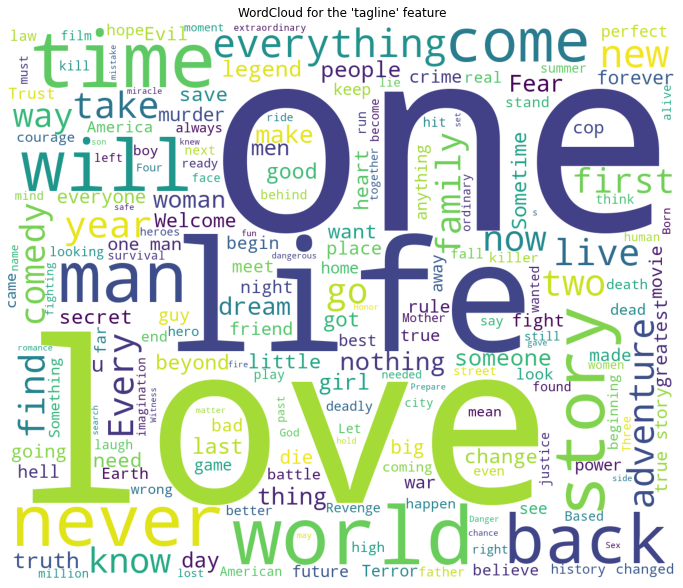

In [642]:
# WordCloud for the tagline

plt.figure(figsize = (12,12))
text = ' '.join(train['tagline'].fillna("").values)
wordcloud = WordCloud(background_color = 'white', width = 1200, height = 1000).generate(text)
plt.imshow(wordcloud)
plt.title("WordCloud for the 'tagline' feature")
plt.axis("off")
plt.show()

<AxesSubplot:xlabel='has_collection', ylabel='revenue'>

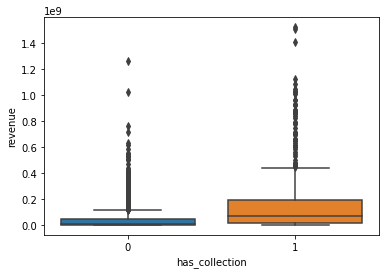

In [643]:
# How does the fact that film is a part of a collection affects the total revenue

sns.boxplot(x="has_collection", y='revenue', data=train)

In [644]:
train['production_company_Warner Bros.']


0       0
1       0
2       0
3       0
4       0
       ..
2995    1
2996    0
2997    0
2998    0
2999    0
Name: production_company_Warner Bros., Length: 3000, dtype: int64

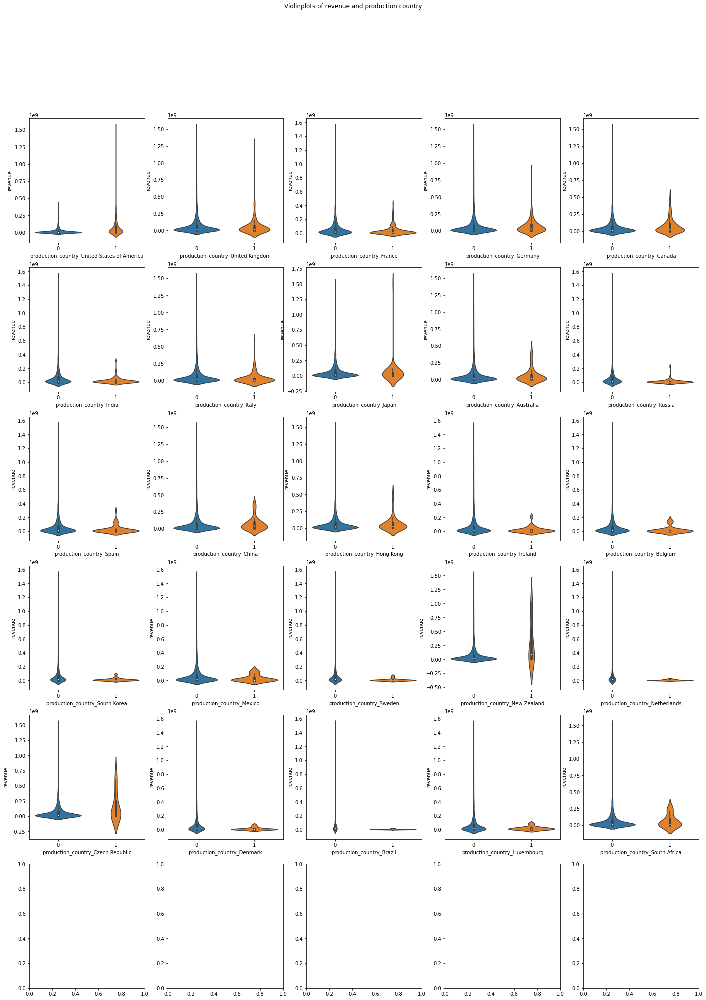

In [645]:
# Violinplots (better version of a box plot | shows distribution of the data)

f, axes = plt.subplots(6, 5, figsize = (24, 32))
plt.suptitle("Violinplots of revenue and production country")
for i, e in enumerate([col for col in train.columns if 'production_country' in col]):
 sns.violinplot(x = e, y = "revenue", ax = axes[i // 5][i % 5], data = train)

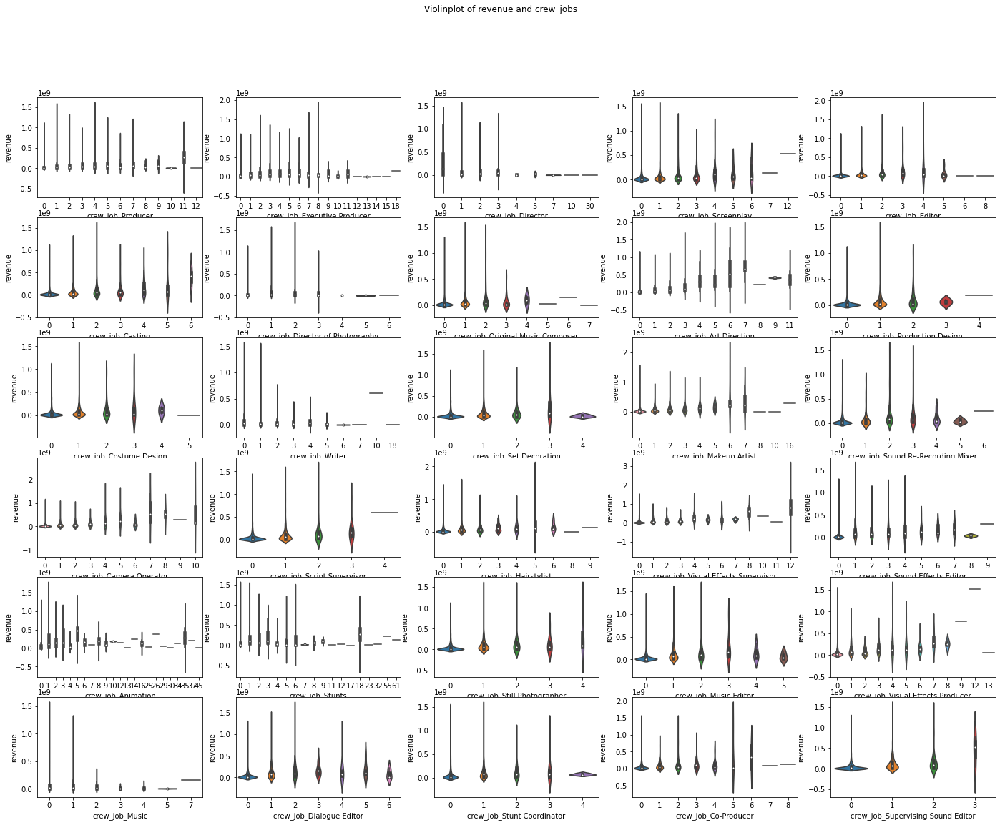

In [646]:
f, axes = plt.subplots(6, 5,figsize = (24, 18))
plt.suptitle("Violinplot of revenue and crew_jobs")
for i, e in enumerate([col for col in train.columns if "crew_job_" in col]):
 sns.violinplot(x = e, y = 'revenue', data = train, ax = axes[i // 5][i % 5])

In [647]:
# Get rid of the irrelevant features in the dataset

train = train.drop(['log_revenue', "status", "homepage", "imdb_id", "poster_path", "release_date"], axis = 1)
test = test.drop(["homepage", "imdb_id", "poster_path", "release_date", "status"], axis = 1)

In [648]:
for col in train.columns:
 if train[col].nunique() == 1:
  print(col)
  train = train.drop([col], axis = 1)
  test = test.drop([col], axis = 1)

language_


In [649]:
# Get all the 'non-numeric' features

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
train_categorical = train.select_dtypes(exclude=numerics).columns
train_categorical

Index(['original_language', 'original_title', 'overview', 'tagline', 'title',
       'collection_name', 'all_genres', 'all_production_companies',
       'all_countries', 'all_languages', 'all_keywords'],
      dtype='object')

In [650]:
# Encode some of the given features

def encode_features(df):
 features_to_encode = ['collection_name', "all_genres", "original_language"]
 features_to_encode = np.concatenate((features_to_encode, train_categorical))
 print(features_to_encode)

 for f in features_to_encode:
  le = LabelEncoder()
  
  df[f] = le.fit_transform(df[f].fillna("").astype(str))

 return df

train = encode_features(train)
test = encode_features(test)

['collection_name' 'all_genres' 'original_language' 'original_language'
 'original_title' 'overview' 'tagline' 'title' 'collection_name'
 'all_genres' 'all_production_companies' 'all_countries' 'all_languages'
 'all_keywords']
['collection_name' 'all_genres' 'original_language' 'original_language'
 'original_title' 'overview' 'tagline' 'title' 'collection_name'
 'all_genres' 'all_production_companies' 'all_countries' 'all_languages'
 'all_keywords']


In [651]:
# Create new "length" feature for each existing column that contains text

text_features = ["tagline", "title", "overview", "original_title"]

def get_length(df):

 for f in text_features:
  df[f'len_{f}'] = df[f].fillna("").apply(lambda x: len(str(x)))
  df[f"word_counter_{f}"] = df[f].fillna("").apply(lambda x: len(str(x).split(" ")))

  df = df.drop([f], axis = 1)

 return df

train = get_length(train)
test = get_length(test)

In [652]:
X = train.drop(["id", "revenue"], axis = 1)
y = np.log1p(train["revenue"])
X_test = test.drop(['id'], axis = 1)

In [653]:
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state = 74, test_size = 0.1)

In [658]:
# Tune hyperparameters for the model (Taken from: https://www.kaggle.com/code/sz8416/simple-bayesian-optimization-for-lightgbm)

def bayesion_opt_lgbm(X, y, init_iter=3, n_iters=7, random_state=11, seed = 101, num_iterations = 100):
  dtrain = lgb.Dataset(data=X, label=y)
  def lgb_r2_score(preds, dtrain):
      labels = dtrain.get_label()
      return 'r2', r2_score(labels, preds), True
  # Objective Function
  def hyp_lgbm(num_leaves, feature_fraction, bagging_fraction, max_depth, min_split_gain, min_child_weight):
        
          params = {'application':'regression','num_iterations': num_iterations,
                    'learning_rate':0.05, 'early_stopping_round':50,
                    'metric':'lgb_r2_score'} # Default parameters
          params["num_leaves"] = int(round(num_leaves))
          params['feature_fraction'] = max(min(feature_fraction, 1), 0)
          params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
          params['max_depth'] = int(round(max_depth))
          params['min_split_gain'] = min_split_gain
          params['min_child_weight'] = min_child_weight
          cv_results = lgb.cv(params, dtrain, nfold=5, seed=seed,categorical_feature=[], stratified=False,
                              verbose_eval =None, feval=lgb_r2_score)
          # print(cv_results)
          return np.max(cv_results['r2-mean'])
  # Domain space-- Range of hyperparameters 
  pds = {'num_leaves': (80, 100),
            'feature_fraction': (0.1, 0.9),
            'bagging_fraction': (0.8, 1),
            'max_depth': (17, 25),
            'min_split_gain': (0.001, 0.1),
            'min_child_weight': (10, 25)
            }

  # Surrogate model
  optimizer = BayesianOptimization(hyp_lgbm, pds, random_state=random_state)
                                    
  # Optimize
  optimizer.maximize(init_points=init_iter, n_iter=n_iters)

  return optimizer.max['params']

params = bayesion_opt_lgbm(X, y, init_iter=50, n_iters=100, random_state=77, seed = 101, num_iterations = 2000)
print(params)

|   iter    |  target   | baggin... | featur... | max_depth | min_ch... | min_sp... | num_le... |
-------------------------------------------------------------------------------------------------
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\basic.py:1705: UserWarning:

categorical_feature in Dataset is overridden.
New categorical_feature is []



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits wit

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002700 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits w

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004362 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004253 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits w

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002920 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003705 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002911 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004902 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004997 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003802 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004060 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008057 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002870 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002928 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[Light

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[Light

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004882 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004715 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002825 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Info] Start training from score 15.984612
[LightGBM] [Info] Start training from score 15.978794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Info

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007654 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005015 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004506 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003936 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005544 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003170 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006902 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003948 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003575 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003708 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004959 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006001 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003855 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004842 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004001 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004548 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003816 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007207 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Info] Start training from score 15.950146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.919897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 15.976482
[LightGBM] [Warning] No further splits w

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004760 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002864 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003062 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003501 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004503 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004739 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003398 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003902 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003981 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003999 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003537 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004244 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004783 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002920 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003831 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003984 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003894 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003909 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003317 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002957 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005485 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003970 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003684 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004114 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003197 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004739 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003800 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003089 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002690 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004314 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003862 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003875 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003974 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004186 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003886 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003933 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002917 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003741 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004247 seconds.
You can set `forc

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

c:\Users\Administrator\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning:

Found `early_stopping_round` in params. Will use it instead of argument



[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3555
[LightGBM] [Info] Number of data points in the train set: 2400, number of used features: 242
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003077 seconds.
You can set `forc

In [657]:
params = {
 "bagging_fraction": 0.85,
 "feature_fraction": 0.32,
 "max_depth": 21,
 "min_child_weight": 15,
 "min_split_gain": 0.05,
 "num_leaves": 95,
 "boosting": "gbdt",
 "learning_rate": 0.01,
 "objective": "regression",
 "bagging_seed": 11,
 "metric": "rmse",
 "lambda_l1": 0.2,
 "verbosity": -1,
 "bagging_freq": 1,
 "min_data_in_leaf": 20
}

model1 = lgb.LGBMRegressor(**params, n_estimators=)